## Do it! Natural Language Processing using BERT and GPT - part3
#### 한국어 자연어 처리에 관한 내용을 정리하였습니다. Do it! BERT와 GPT로 배우는 자연어 처리(이기창 지음)을 참고하였습니다.
## 3. 숫자 세계로 떠난 자연어
### 3.1 미리 학습된 언어 모델
#### 언어모델(language model) : 단어 시퀀스에 확률을 부여하는 모델(= 단어 시퀀스 입력을 받아 해당 시퀀스가 얼마나 그럴듯한지 확률을 출력하는 모델)
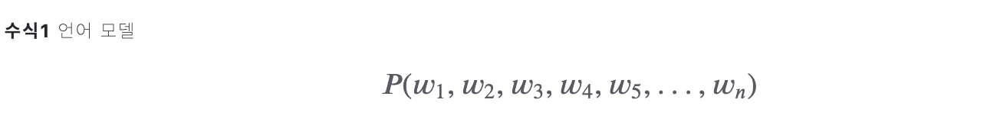
#### 단어 3개로 구성된 문장이 나타내기 위한 사건 : 첫 번째 단어(w1) 등장 -> w1 등장 이후 두 번째 단어(w2) 등장 -> w1, w2 등장 후 세 번째 단어(w3) 등장
#### 전체 단어 시퀀스 등장 확률 = 이전 단어들이 주어졌을 때 다음 단어가 등장할 확률의 연쇄 -> 언어 모델을 이전 단어들이 주어졌을 때 다음 단어가 나타날 확률을 부여하는 모델로 정의하기도 함
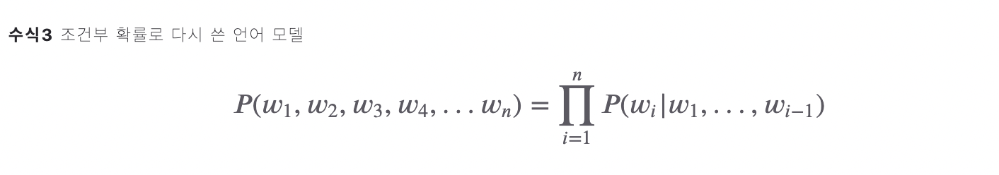

#### 순방향 언어 모델 : 문장 앞부터 뒤로, 사람이 이해하는 순서대로 계산하는 모델 ex. GPT, ELMO
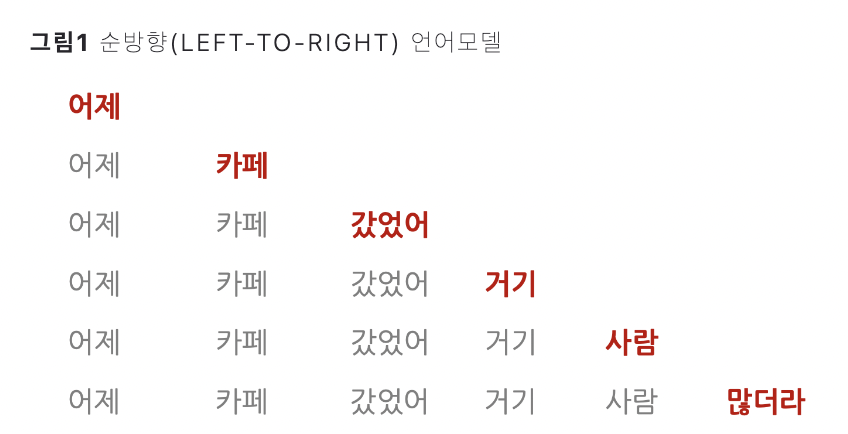
#### 역방향 언어 모델 : 문장 뒤부터 앞으로 계산하는 모델 ex. ELMO(순방향, 역방향 모두 활용)
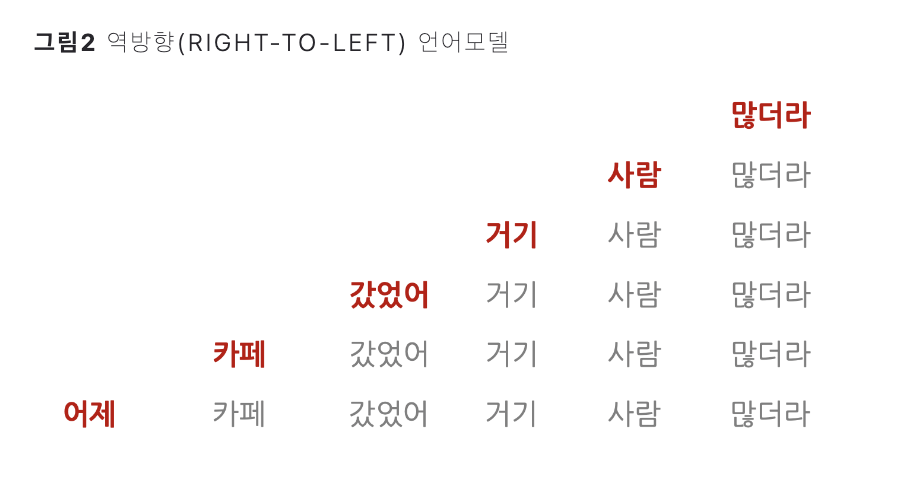

#### 넓은 의미의 언어 모델 : 수식3은 전통적인 의미의 언어 모델의 정의, 아래 수식은 최근 활용되는 정의 -> 맥락이 전제된 상태에서 특정 단어가 나타날 조건부 확률
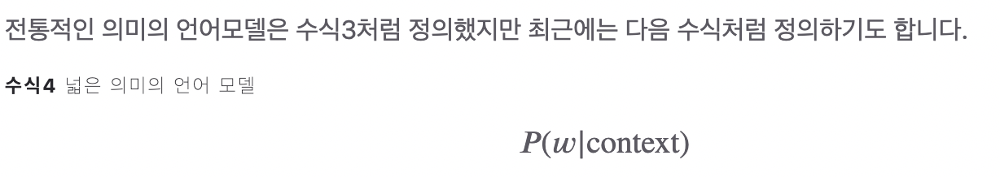

#### 마스크 언어 모델(masked language model) : 학습 대상 문장에 빈칸을 만들어 놓고 해당 빈칸에 올 단어로 적절한 던어가 무엇일지 분류하는 과정으로 학습 ex. BERT -> 문장 전체의 맥락을 참고할 수 있는 장점 - 양방향 성질(bidirectional)
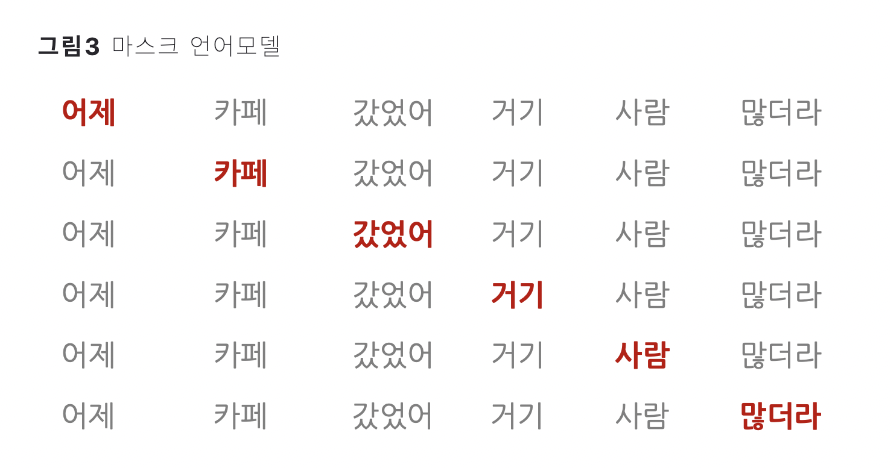

#### 스킵-그램 모델(skip-gram model) : 어떤 단어 앞뒤에 특정 범위를 정해 두고 범위 내에 들어올 단어를 분류하는 과정에서 학습 ex. Word2Vec
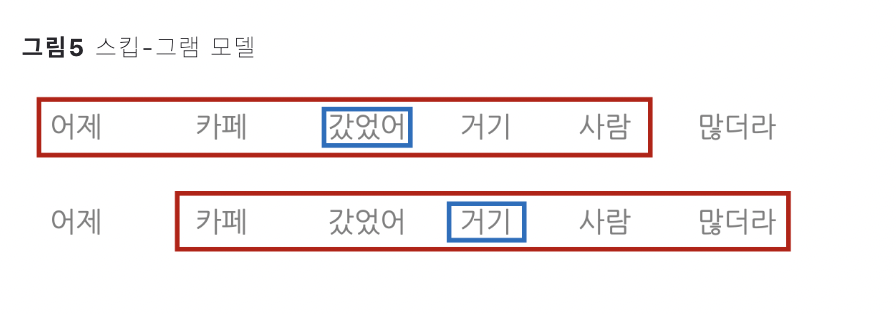

### 3.2 트랜스포머 살펴보기
#### 트랜스포머는 2017년 구글이 제안한 시퀀스-투-시퀀스(sequence-to-sequence) 모델 / BERT, GPT는 모두 트랜스포머 기반 언어 모델
#### 시퀀스-투-시퀀스(sequence-to-sequence) : 특정 속성을 지닌 시퀀스를 다른 속성의 시퀀스로 변환하는 작업 ex. 기계 번역
#### 트랜스포머는 시퀀스-투-시퀀스 과제 수행에 특화된 모델
#### 인코더(encoder) : 소스 시퀀스의 정보를 압축해 디코더로 보내는 역할
#### 디코더(decoder) : 인코더가 보내 준 소스 시퀀스 정보를 받아 타깃 시퀀스 생성하는 역할
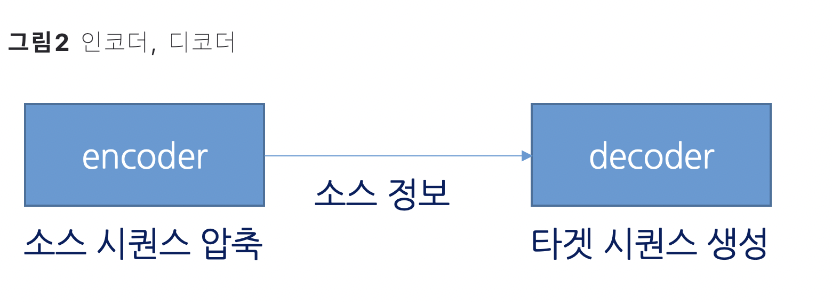
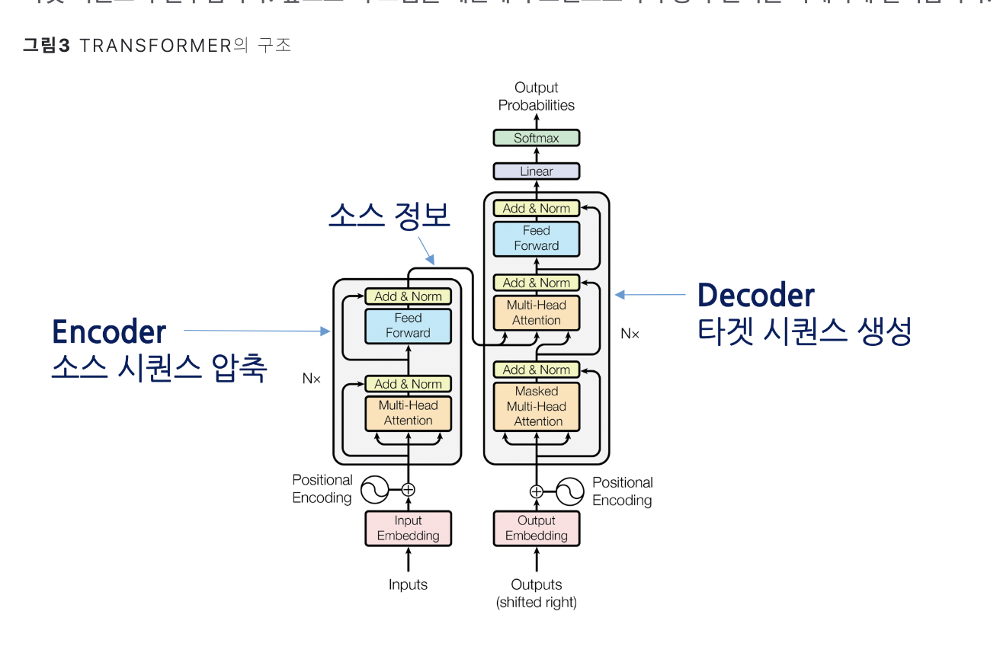

#### 트랜스포머의 최종 출력(디코더 출력)은 타깃 언어의 어휘수만큼의 차원으로 구성된 벡터 - 해당 벡터의 element는 모두 확률
#### 트랜스포머는 인코더와 디코더 입력이 주어졌을 때 정답에 해당하는 단어의 확률값을 높이는 방식으로 학습
#### 학습 중의 디코더 입력과 학습 후 모델이 인퍼런스할 때 디코더 입력은 다름 -> 학습 과정에서는 디코더 입력에 정답 타깃 시퀀스를 넣어주지만 인퍼런스 시에는 현재 디코더 입력에 직전 디코딩 결과를 사용

#### 트랜스포머 인코더 블록 : 멀티 헤드 어텐션(multi-head attention), 피드포워드 뉴럴 네트워크(feedforward neural netword), 잔차 연결(residual connection) 및 레이어 정규화(layer normalization)
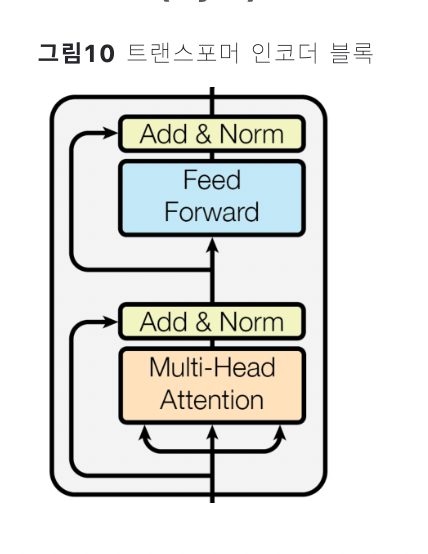
#### 트랜스포머 디코더 블록 : 인코더블록 구성요소 + 마스크를 적용한 멀티 헤드 어텐션(masked multi-head attention)
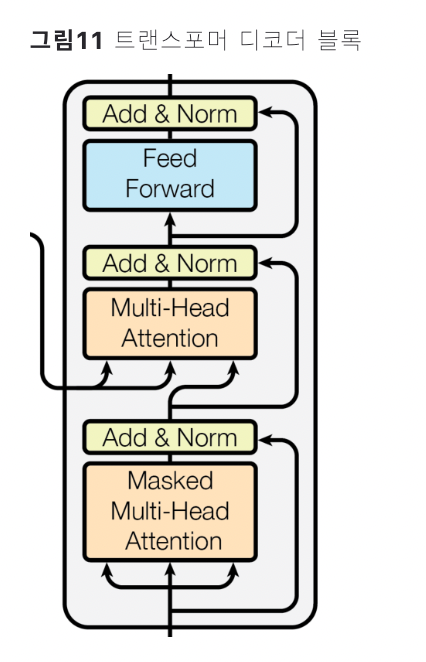

#### attention : 시퀀스 요소 가운데 중요한 요소에 집중하고 그렇지 않은 요소는 무시해 태스크 수행 성능을 끌어 올림 / 기계번역에 최초로 도입 / 디코딩 시 소스 시퀀스 가운데 중요한 요소만 추출
#### 셀프 어텐션(self attention) : 멀티헤드 어텐션의 다른 이름 / 트랜스포머 경쟁력의 원천 / 자신에게 수행하는 어텐션 기법 / 입력 시퀀스 가운데 태스크 수행에 의미 있는 요소들 위주로 정보 추출
#### CNN : 시퀀스의 지역적인 특징을 추출 / 합성곱 필터 크기를 넘어서는 문맥은 읽어내지 못하는 단점이 존재
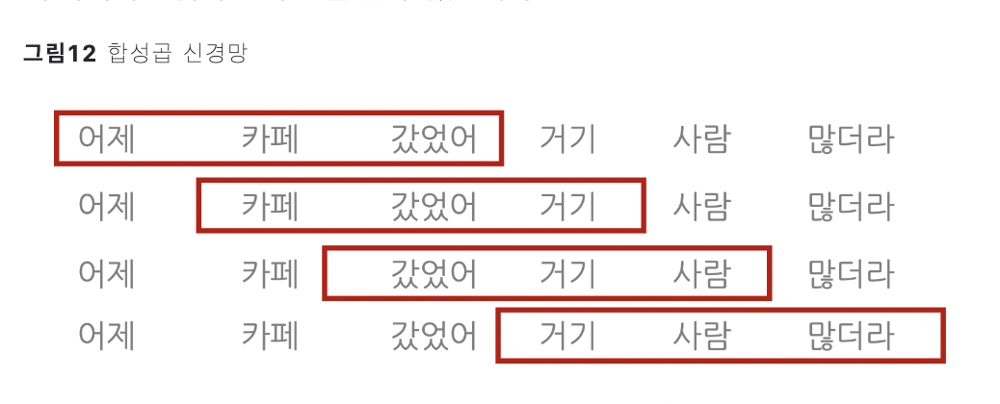

#### RNN : 시퀀스 정보 압축에 강점 / 소스 언어 시퀀스를 차례대로 처리 / 시퀀스 길이가 길어질수록 정보 압축에 문제 발생
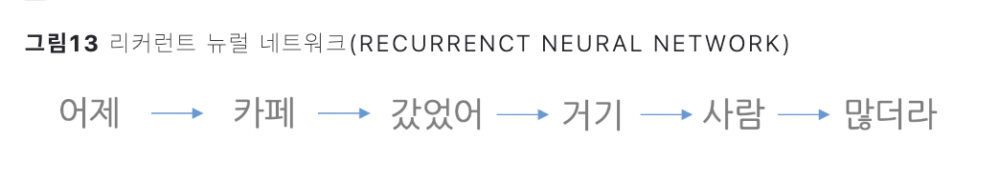

#### attention : 디코더가 타깃 시퀀스를 생성할 때 소스 시퀀스 전체에서 어떤 요소에 주목해야 할지 알려줌 / 소스 시퀀스 길이가 길어지더라도 괜찮음
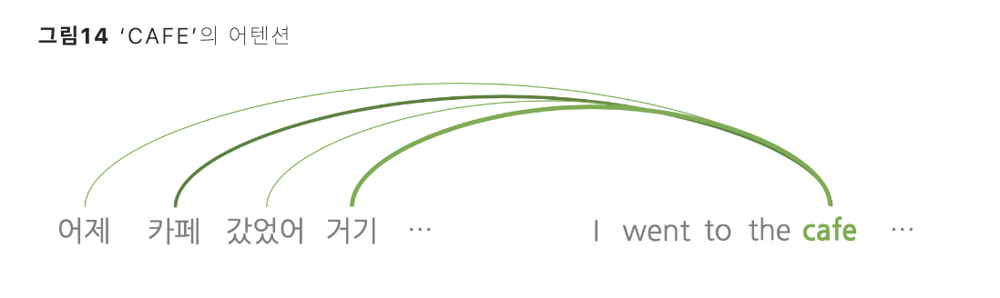

#### self-attention : 자기 자신에 수행하는 attention / 수행 대상은 입력 시퀀스 전체 / 개별 단어와 전체 입력 시퀀스를 대상으로 어텐션 계산을 수행해 문맥 전체를 고려 / 어텐션은 소스 시퀀스 전체 단어들과 타깃 시퀀스 단어 하나 사이를 연결하지만 셀프 어텐션은 입력 시퀀스 전체 단어들 사이를 연결
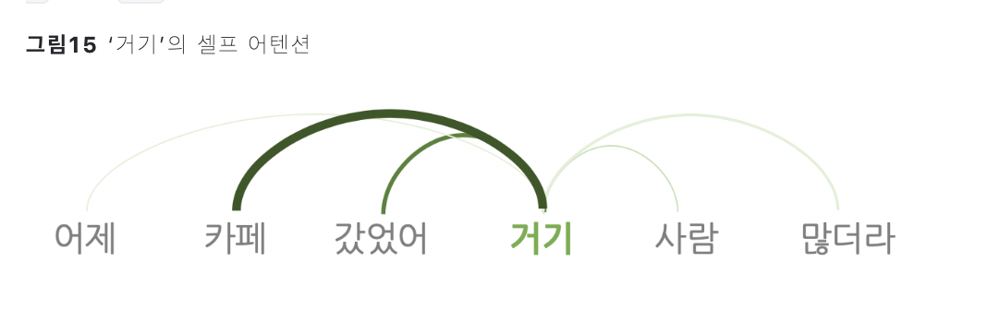
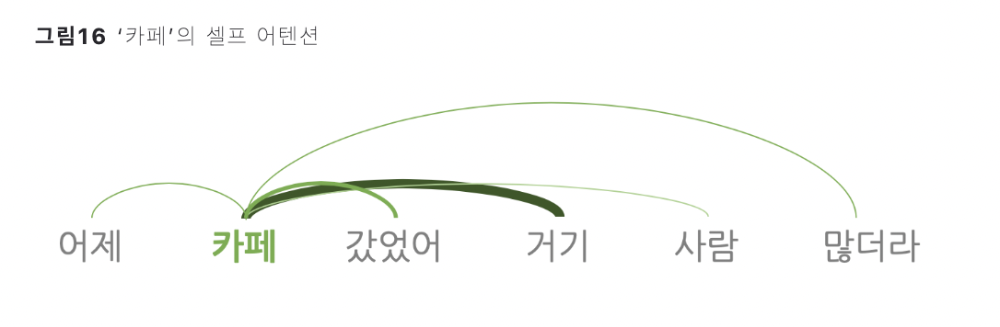

#### self-attention : 쿼리(query), 키(key), 밸류(value) 3가지 요소가 서로 영향을 주고 받는 구조
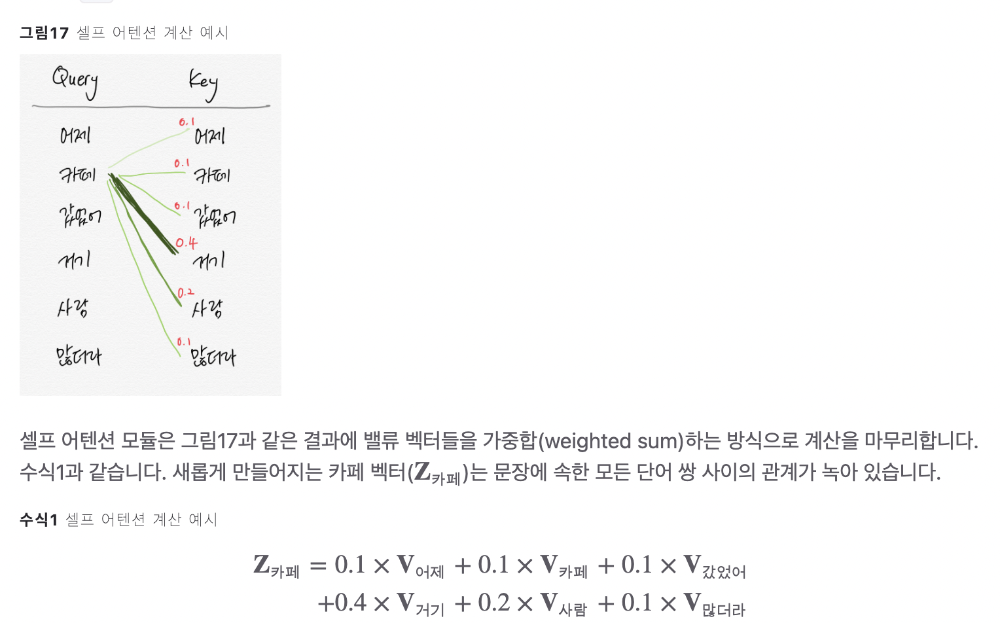

### 3.3 셀프 어텐션 동작 원리
#### 입력층(input layer) : 모델의 입력을 만드는 계층
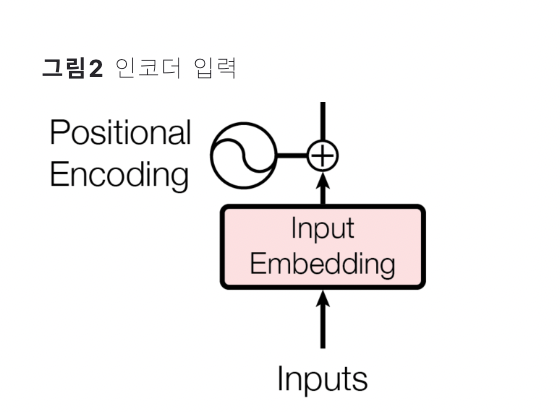
#### 인코더 입력 : 소스 시퀀스의 입력 임베딩 + 위치 정보(positional encoding)
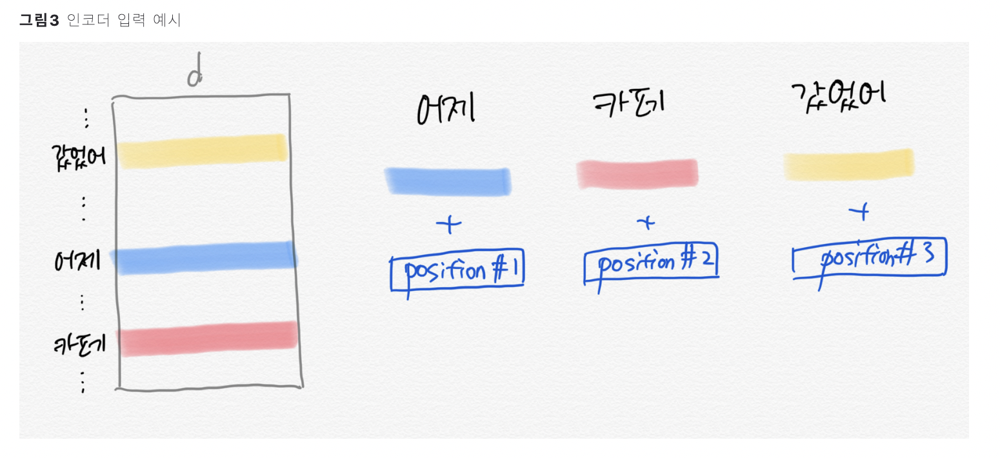

#### 인코더(디코더) 입력층에서 만들어진 벡터 시퀀스가 최초 인코더 블록의 입력이 되며, 그 출력 벡터 시퀀스가 두 번째 인코더(디코더) 블록의 입력이 되며 해당 과정을 N번 반복
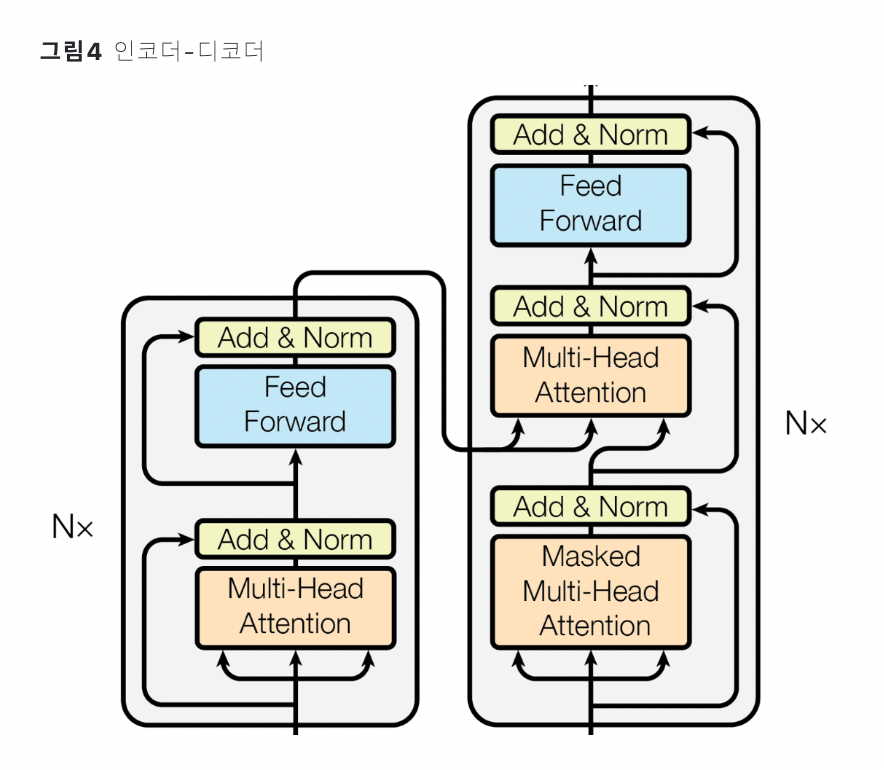

#### 출력층(output layer) : 디코더 마지막 블록의 출력 벡터 시퀀스를 입력으로 받음 / 출력층의 출력은 타깃 언어의 어휘 수만큼의 차원을 갖는 벡터(디코더에 입력된 타깃 시퀀스의 다음 토큰 확률 분포 벡터)
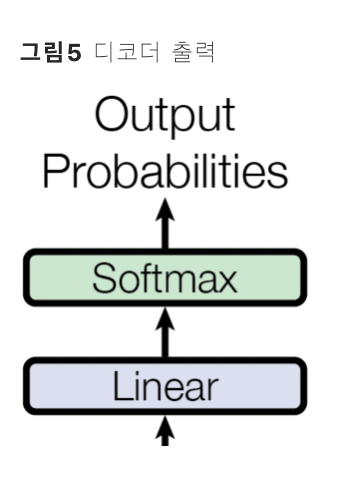
#### 트랜스포머의 학습 : 인코더와 디코더 입력이 주어졌을 때 모델 최종 출력에서 정답에 해당하는 단어의 확률값을 높이는 방식으로 진행

#### (1) 쿼리, 키 , 밸류 만들기
#### X 행렬은 단어 임베딩 차원이 4, 입력된 단어 개수 3 일 때 예시
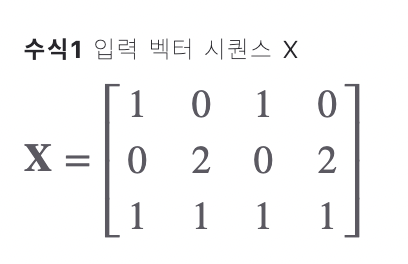
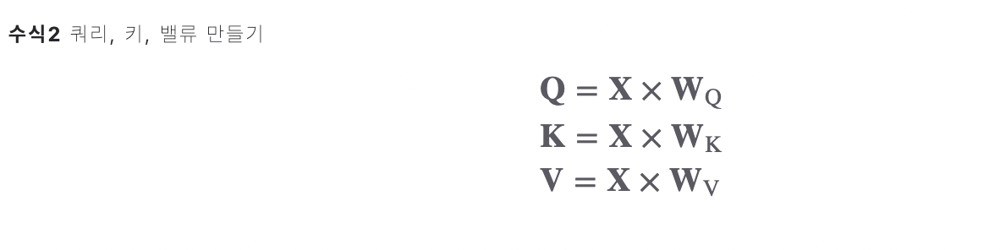
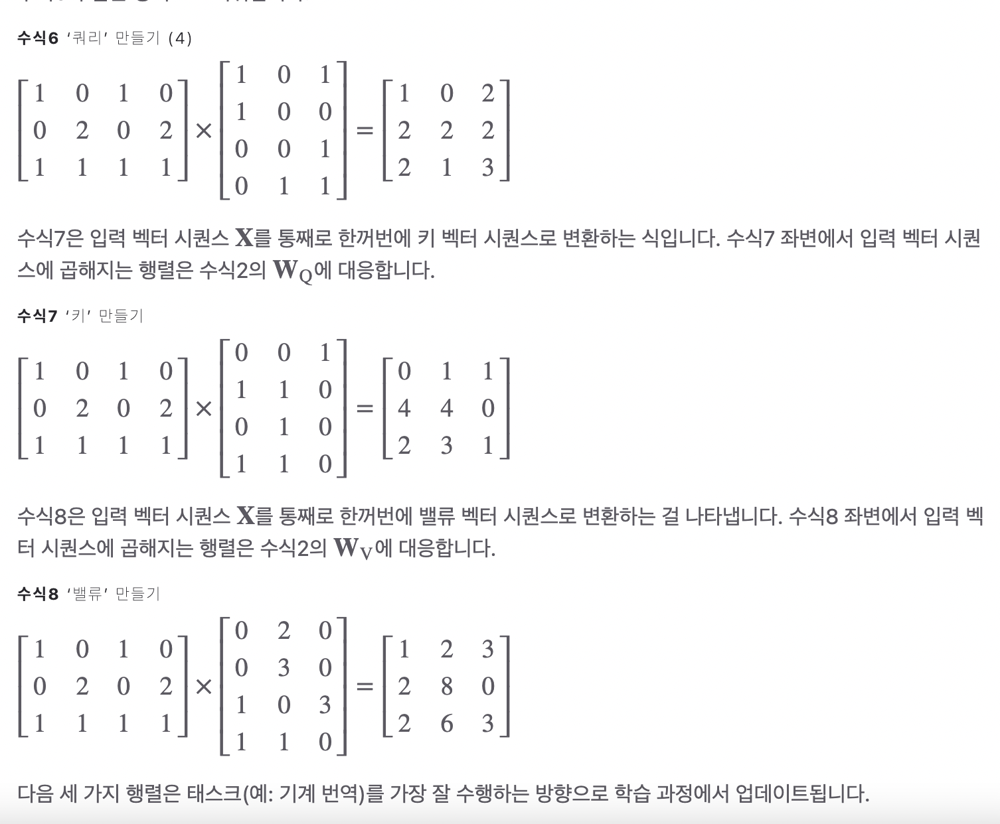

#### (2) 첫 번째 쿼리의 셀프 어텐션 출력값 계산하기
#### 쿼리와 키를 행렬곱한 뒤 해당 행렬의 모든 요솟값을 키 차원수의 제곱근으로 나누고, 이 행렬을 행 단위로 소프트맥스를 취해 스코어 행렬로 만들어준 후 밸류를 행렬곱
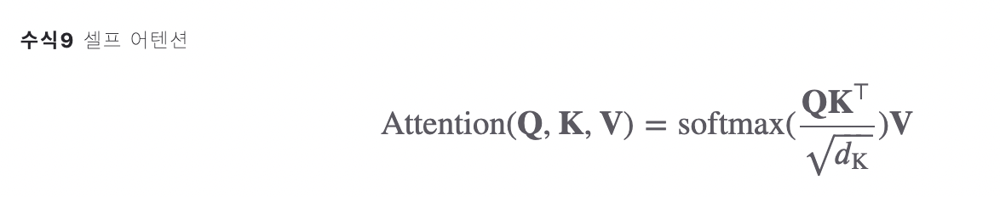

#### (3) 두 번째 쿼리의 셀프 어텐션 출력값 계산하기
#### (4) 세 번쨰 쿼리의 셀프 어텐션 출력값 계산하기
#### (5) 코드로 확인하기

In [4]:
#### 변수 정의
import torch 
x = torch.tensor([
    [1,0,1,0],
    [0,2,0,2],
    [1,1,1,1]
], dtype=float)
w_query = torch.tensor([
    [1,0,1],
    [1,0,0],
    [0,0,1],
    [0,1,1]
], dtype=float)
w_key = torch.tensor([
    [0,0,1],
    [1,1,0],
    [0,1,0],
    [1,1,0]
], dtype=float)
w_value = torch.tensor([
    [0,2,0],
    [0,3,0],
    [1,0,3],
    [1,1,0]
], dtype=float)

#### 쿼리, 키, 밸류 만들기
keys = torch.matmul(x, w_key)
querys = torch.matmul(x, w_query)
values = torch.matmul(x, w_value)

#### 어텐션 스코어 만들기 
attn_scores = torch.matmul(querys, keys.T)
print(attn_scores)

#### 소프트맥스 확률값 만들기
import numpy as np
from torch.nn.functional import softmax
key_dim_sqrt = np.sqrt(keys.shape[-1])
attn_probs = softmax(attn_scores / key_dim_sqrt, dim =1 )
print(attn_probs)

#### 소프트맥스 확률과 밸류를 가중합
weighted_values = torch.matmul(attn_probs, values)
print(weighted_values)

tensor([[ 2.,  4.,  4.],
        [ 4., 16., 12.],
        [ 4., 12., 10.]], dtype=torch.float64)
tensor([[1.3613e-01, 4.3194e-01, 4.3194e-01],
        [8.9045e-04, 9.0884e-01, 9.0267e-02],
        [7.4449e-03, 7.5471e-01, 2.3785e-01]], dtype=torch.float64)
tensor([[1.8639, 6.3194, 1.7042],
        [1.9991, 7.8141, 0.2735],
        [1.9926, 7.4796, 0.7359]], dtype=torch.float64)


#### 멀티 헤드 어텐션(multi head attention) : 셀프 어텐션을 동시에 여러 분 수행 / 여러 헤드가 독자적으로 셀프 어텐션을 계산
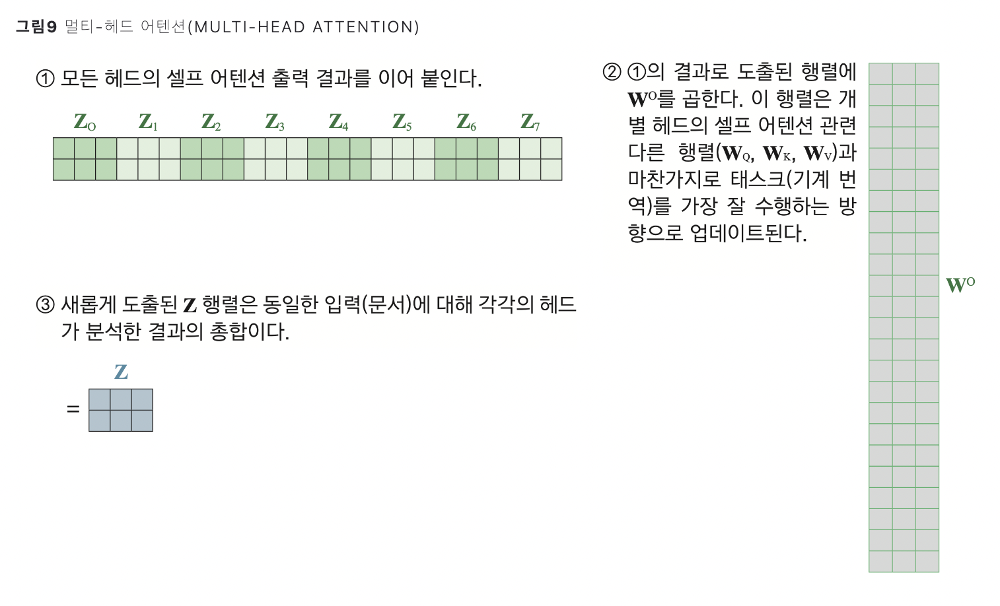
#### 멀티 헤드 어센텬의 최중 수행결과 : 입력단어수 x 목표 차원수

#### 마스크 멀티 헤드 어텐션(masked multi-head attention) : 정답을 포함한 타깃 시퀀스의 미래 정보를 셀프 어텐션 계산에서 제외(마스킹) / 제외 대상 단어들의 소프트맥스 확률은 0이 되도록 함
#### 인퍼런스 과정 : 소스 언어 문장을 인코더에 입력해 인코더 마지막 블록의 단어 벡터 시퀀스 추출 -> 인코더에서 넘어온 소스 언어 문장 정보와 디코더에 타깃 문장 시작을 알리는 스페셜 토큰을 넣어서 타깃 언어의 첫 번째 토큰을 생성 -> 인코더 쪽에서 넘어온 소스 언어 문장 정보와 이전에 생성된 타깃 언어 토큰 시퀀스를 디코더에 넣어서 만든 정보로 타깃 언어의 다음 토큰 생성 -> 생성된 문장의 길이가 충분하거나 문장 끝을 알리는 스페셜 토큰이 나올때까지 반복

### 3.4 트랜스포머에 적용된 기술들
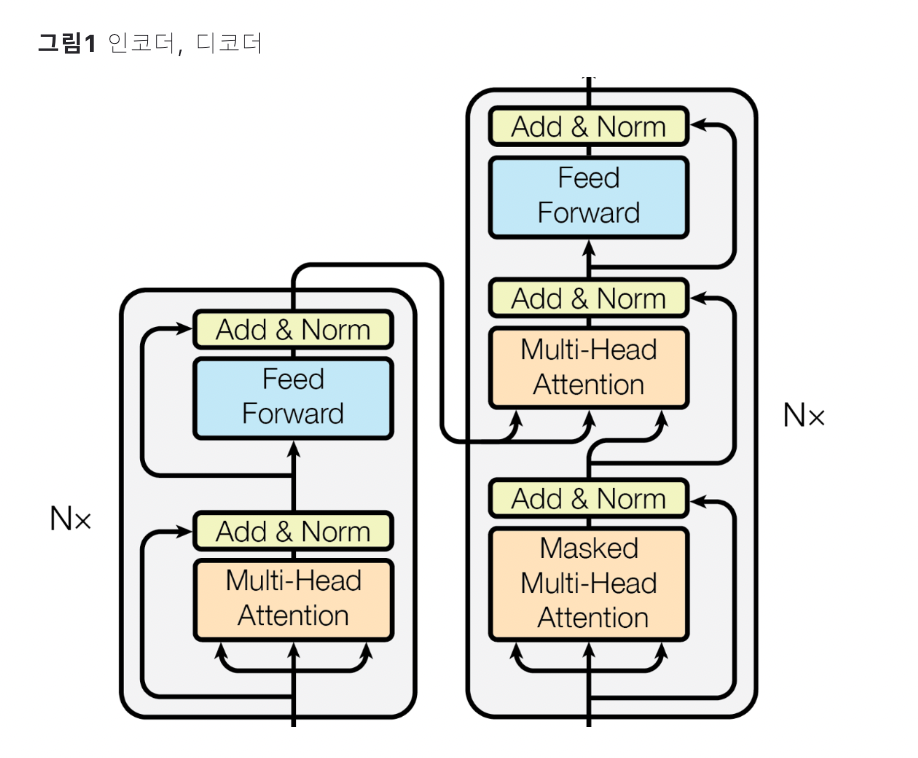

#### 피드포워드 뉴럴 네트워크(feedforward neural network) : 입력은 현재 블록의 멀티 헤드 어텐션의 개별 출력 벡터 / 입력층, 은닉층, 출력층 3개의 계층으로 구성
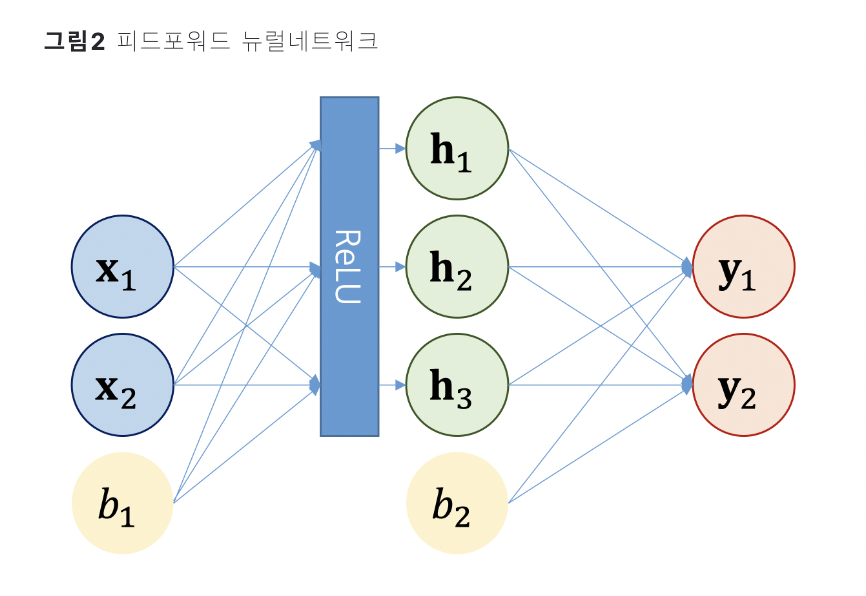
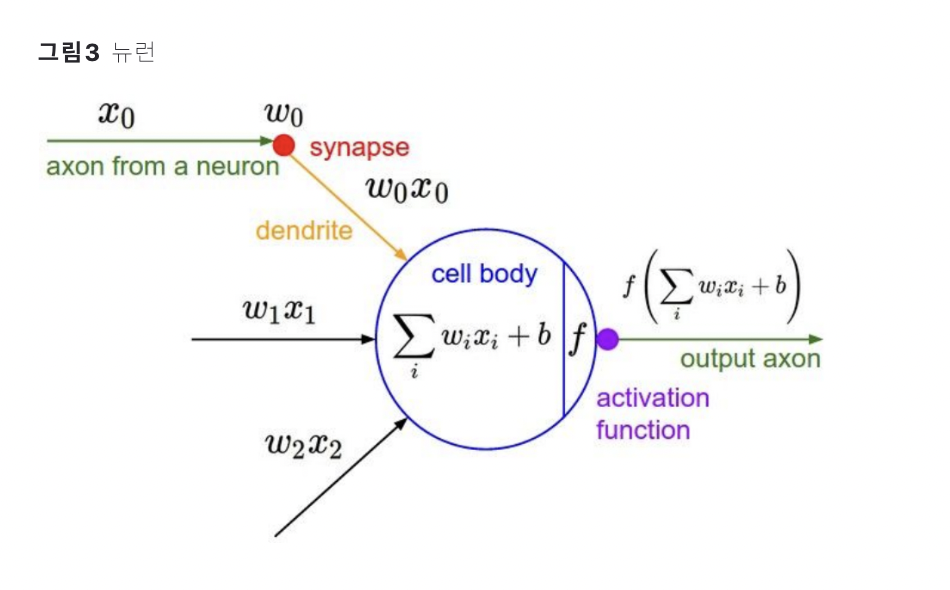


In [6]:
#### 피드포워드 뉴럴 네트워크 계산 예시
import torch
x = torch.tensor([2,1])
w1 = torch.tensor([[3,2,-4], [2,-3,1]])
b1 = 1
w2 = torch.tensor([[-1,1],[1,2],[3,1]])
b2 = -1

h_preact = torch.matmul(x, w1) + b1
h = torch.nn.functional.relu(h_preact)
y = torch.matmul(h, w2) + b2

print(h_preact)
print(h)
print(y)

tensor([ 9,  2, -6])
tensor([9, 2, 0])
tensor([-8, 12])


#### 잔차 연결(residual connection) : 블록이나 레이어 계산을 건너뛰는 경로 / 모델 중간에 블록의 건너뛰는 경로를 설정하여 학습을 쉽게하는 효과 제공
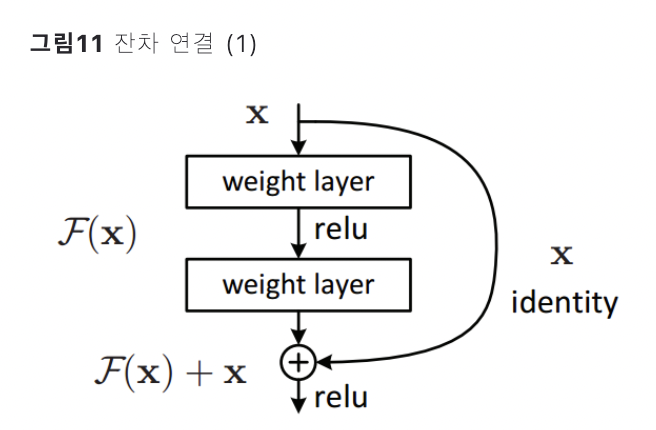

#### 레이어 정규화(layer normalization) : 학습이 안정되고 학습 속도 향상
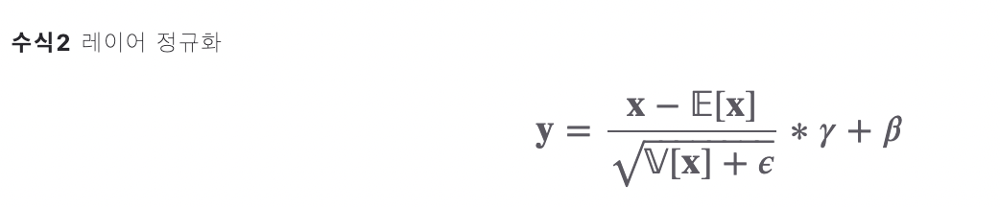

In [8]:
#### 레이어 정규화
import torch
input = torch.tensor([[1.0, 2.0, 3.], [1., 1.,1.]])
m =torch.nn.LayerNorm(input.shape[-1])
output = m(input)
print(output)
print(m.weight)
print(m.bias)

tensor([[-1.2247,  0.0000,  1.2247],
        [ 0.0000,  0.0000,  0.0000]], grad_fn=<NativeLayerNormBackward0>)
Parameter containing:
tensor([1., 1., 1.], requires_grad=True)
Parameter containing:
tensor([0., 0., 0.], requires_grad=True)


#### 드롭아웃 : 과적합 방지 / 뉴런의 일부를 확률적으로 0으로 대치하여 계산에서 제외 / 학습 과정에서만 적용되고, 인퍼런스 시에는 사용되지 않음
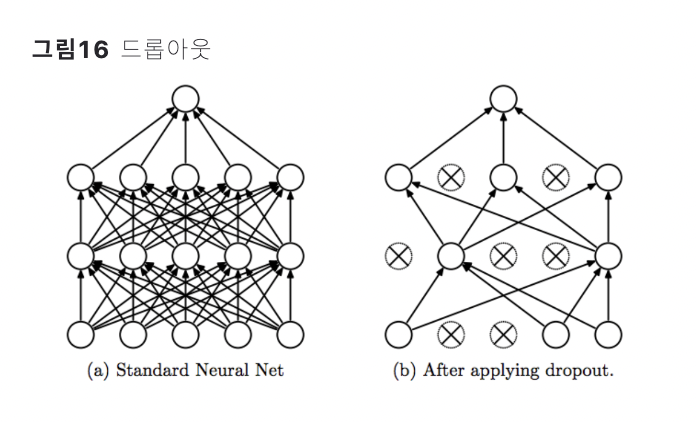

In [11]:
#### 드롭아웃
import torch
m = torch.nn.Dropout(p=0.2)
input = torch.randn(1, 10)
output = m(input)
print(input)
print(output)

tensor([[-0.6340, -0.1621,  0.3948,  0.8173,  0.0628,  0.5308, -0.9309, -1.6742,
         -1.5050, -0.7606]])
tensor([[-0.0000, -0.2027,  0.4935,  1.0216,  0.0785,  0.6635, -1.1636, -2.0928,
         -1.8812, -0.9507]])


### 3.5 BERT와 GPT 비교
#### GPT : 언어 모델 / 이전 단어들이 주어졌을 때 다음 단어가 무엇인지 맞히면서 프리트레인 / 일방향 / 문장 생성에 활용 / 트랜스포머의 디코더만 사용
#### BERT : 마스크 언어 모델 / 문장 중간에 빈칸을 만들고 해당 빈칸에 어떤 단어가 적절할지 맞히는 과정에서 프리트레인 / 양방향 / 문장 의미 추출에 활용 / 트랜스포머의 인코더만 사용
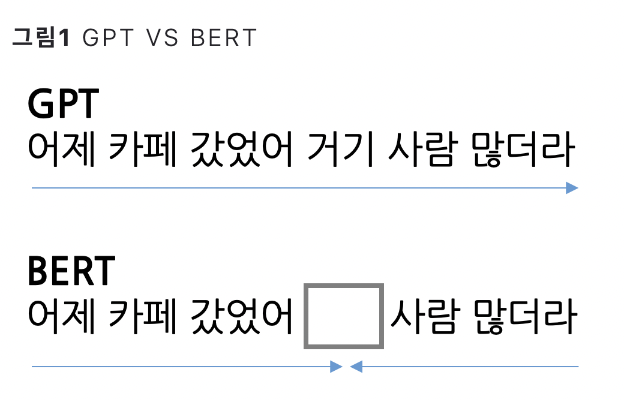

#### GPT 구조
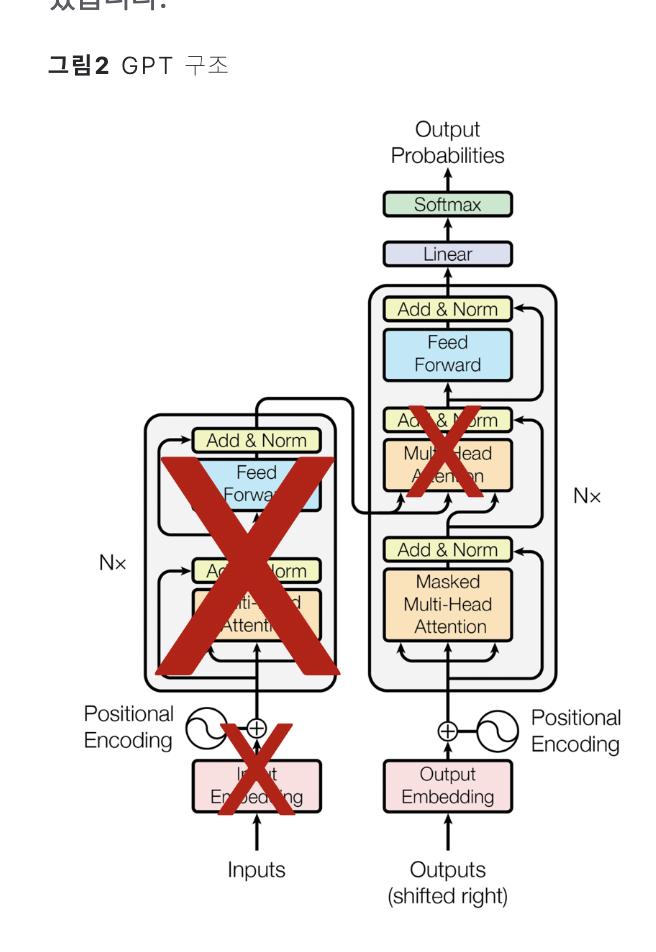
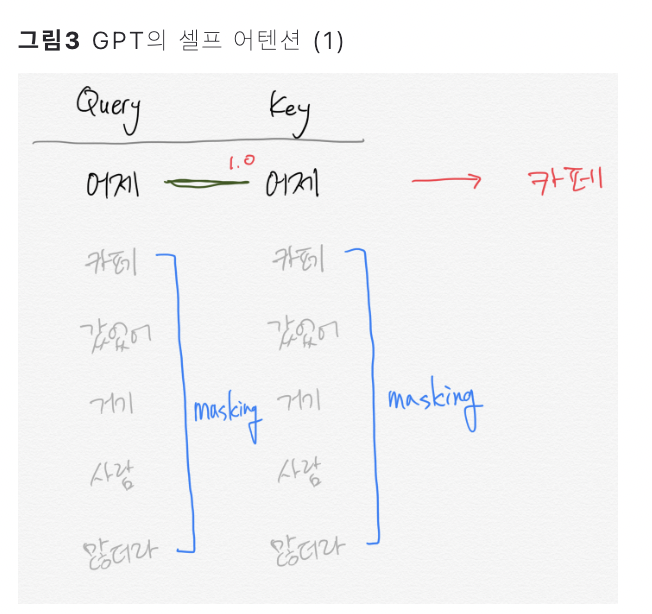

#### BERT 구조
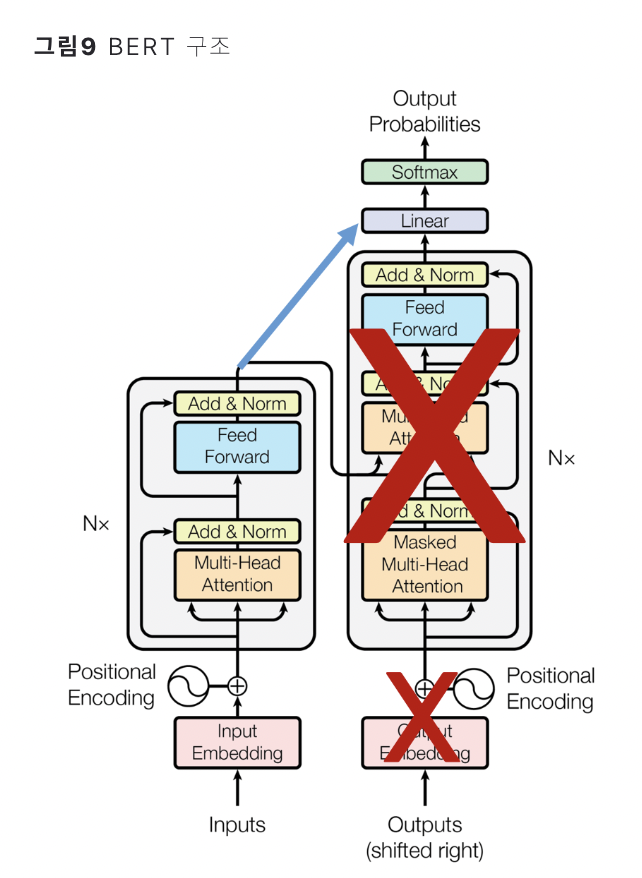
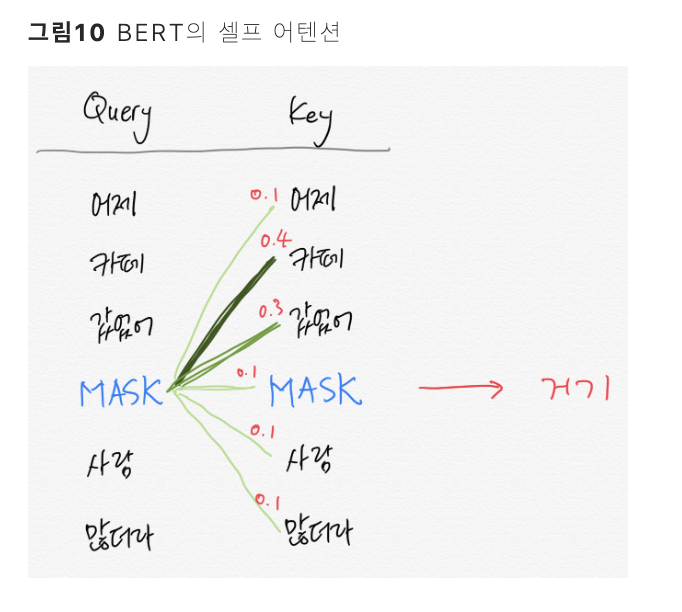

### 3.6 단어/문장을 벡터로 변환하기
#### 파인튜닝(fine-tuning) : 프리트레인을 마친 언어 모델과 그 위의 작은 모듈을 포함한 전체 모델을 다운스트림 데이터로 업데이트 하는 과정
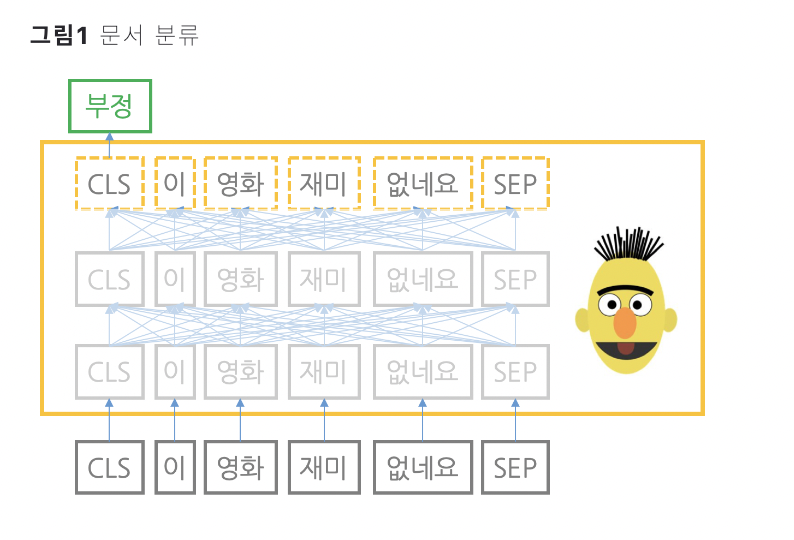
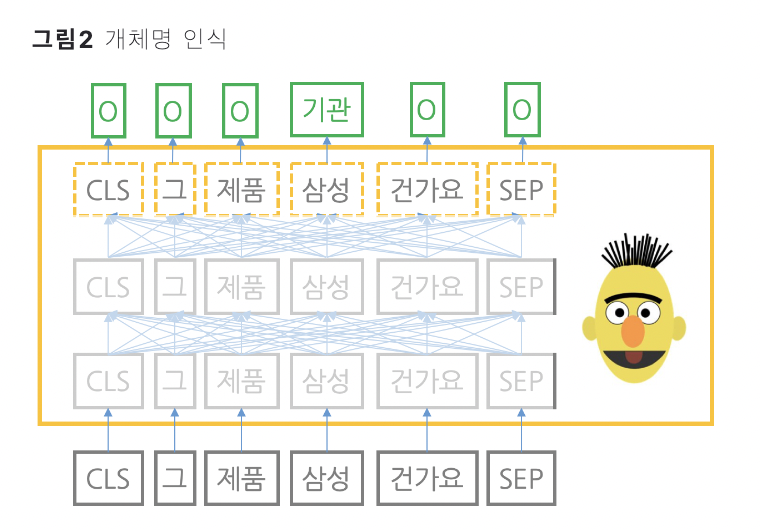

In [12]:
#### 토크나이저 선언
from transformers import BertTokenizer
tokenizer = BertTokenizer.from_pretrained("beomi/kcbert-base", do_lower_case = False,)

In [15]:
#### 모델 선언
from transformers import BertConfig, BertModel
pretrained_model_config = BertConfig.from_pretrained('beomi/kcbert-base')
model = BertModel.from_pretrained('beomi/kcbert-base', config = pretrained_model_config,)
pretrained_model_config

Some weights of the model checkpoint at beomi/kcbert-base were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


BertConfig {
  "_name_or_path": "beomi/kcbert-base",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "directionality": "bidi",
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 300,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "pooler_fc_size": 768,
  "pooler_num_attention_heads": 12,
  "pooler_num_fc_layers": 3,
  "pooler_size_per_head": 128,
  "pooler_type": "first_token_transform",
  "position_embedding_type": "absolute",
  "transformers_version": "4.10.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30000
}

In [16]:
#### 입력값 만들기
sentences = ['안녕하세요', '하이!']
feature = tokenizer(sentences, max_length = 10, padding = 'max_length', truncation = True,)
feature

{'input_ids': [[2, 19017, 8482, 3, 0, 0, 0, 0, 0, 0], [2, 15830, 5, 3, 0, 0, 0, 0, 0, 0]], 'token_type_ids': [[0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], 'attention_mask': [[1, 1, 1, 1, 0, 0, 0, 0, 0, 0], [1, 1, 1, 1, 0, 0, 0, 0, 0, 0]]}

In [19]:
#### 피처를 토치 텐서로 변환
features = {k : torch.tensor(v) for k, v in feature.items()}

#### 임베팅 계산하기
outputs = model(**feature)

AttributeError: 'list' object has no attribute 'size'